# Energy system model of the Spain

In [19]:
import calliope
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

calliope.set_log_verbosity("INFO", include_solver_output=True)

# 1. Reference case
### 1.1. Create and solve the model

In [ ]:
model = calliope.read_yaml('model/model.yaml',scenario='base')

[2025-12-08 22:15:45] INFO     Math init | loading pre-defined math.
[2025-12-08 22:15:45] INFO     Math init | loading math files {'milp', 'base', 'storage_inter_cluster', 'operate', 'spores'}.
[2025-12-08 22:15:45] INFO     Model: preprocessing data
[2025-12-08 22:15:45] INFO     Math build | building applied math with ['base', 'operate'].


[2025-12-08 22:15:45] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:15:45] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:15:45] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:15:45] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:15:45] INFO     Model: initialisation complete


In [21]:
model.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-10-01 00:00:00  NLD    demand_power    23513.333333
2024-10-01 01:00:00  NLD    demand_power    22478.083333
2024-10-01 02:00:00  NLD    demand_power    21627.416667
2024-10-01 03:00:00  NLD    demand_power    21228.416667
2024-10-01 04:00:00  NLD    demand_power    21190.583333
                                                ...     
2025-09-30 19:00:00  NLD    demand_power    29335.833333
2025-09-30 20:00:00  NLD    demand_power    31345.000000
2025-09-30 21:00:00  NLD    demand_power    30769.416667
2025-09-30 22:00:00  NLD    demand_power    27631.916667
2025-09-30 23:00:00  NLD    demand_power    24969.083333
Name: sink_use_equals, Length: 8759, dtype: float64

In [22]:
model.build()
model.solve()

[2025-12-08 22:15:45] INFO     Model: backend build starting
[2025-12-08 22:15:46] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-08 22:15:46] INFO     Optimisation Model | variables | Generated.
[2025-12-08 22:15:47] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-08 22:15:50] INFO     Optimisation Model | constraints | Generated.
[2025-12-08 22:15:50] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-08 22:15:50] INFO     Optimisation Model | objectives | Generated.
[2025-12-08 22:15:50] INFO     Model: backend build complete
[2025-12-08 22:15:53] INFO     Optimisation model | starting model in base mode.
[2025-12-08 22:15:56] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpyx_77skx.pyomo.lp
Reading time = 0.35 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [23]:
# It is helpful to store the model results as a whole in NetCDF format, which Calliope can import back
# at any later time. 
model.to_netcdf('results/default_results.nc')

In [24]:
# Alternatively, results can be exported as a series of .csv files for inspection and analysis in Excel or
# other software that may benefit from .csv data
# model.to_csv('results/default_results_csv')

### 1.2. Marginal technology

In [25]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

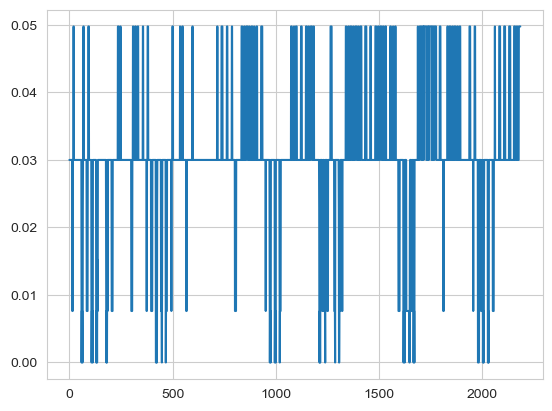

In [26]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [27]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [28]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [29]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [30]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [31]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,1.057958e-11
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,6.008347e-12
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,3.151712e-12
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,1.535289e-12
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,8.308458e-13


In [32]:
tech_colors = {
    "load_shedding": "#000000",
    "ccgt": "#E37A72",
    "nuclear": "#F3007A",
    "hydro": "#7900f3",
    "solar_pv": "#F9D956",
    "wind_onshore": "#56F9C0",
    "wind_offshore": "#56CBF9"
}

In [33]:
# display timesteps in days_of_interest only
marginal_tech_month = marginal_tech[marginal_tech['timesteps'].isin(days_of_interest)]
marginal_tech_month

,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.030000,0.030000,1.057958e-11
1,2024-10-01 01:00:00,NLD,hydro,0.030000,0.030000,6.008347e-12
2,2024-10-01 02:00:00,NLD,hydro,0.030000,0.030000,3.151712e-12
3,2024-10-01 03:00:00,NLD,hydro,0.030000,0.030000,1.535289e-12
4,2024-10-01 04:00:00,NLD,hydro,0.030000,0.030000,8.308458e-13
...,...,...,...,...,...,...
2180,2024-12-30 20:00:00,NLD,ccgt,0.049768,0.049768,5.382847e-12
2181,2024-12-30 21:00:00,NLD,ccgt,0.049768,0.049768,5.443819e-12
2182,2024-12-30 22:00:00,NLD,ccgt,0.049768,0.049768,9.015365e-12
2183,2024-12-30 23:00:00,NLD,ccgt,0.049768,0.049768,1.925199e-11


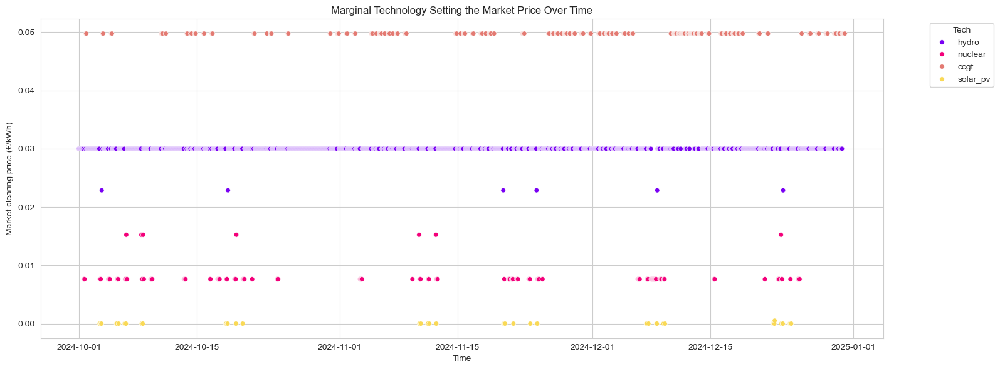

In [34]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal Technology Setting the Market Price Over Time")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro       1671
ccgt         310
nuclear      154
solar_pv      50
Name: count, dtype: int64
techs
hydro       0.764760
ccgt        0.141876
nuclear     0.070481
solar_pv    0.022883
Name: share, dtype: float64
[2025-12-08 22:16:01] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(

[2025-12-08 22:16:01] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')



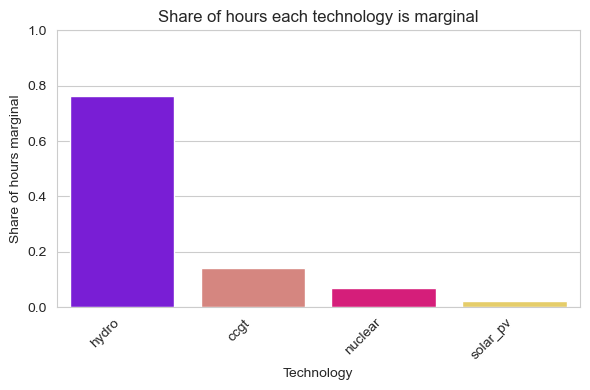

In [35]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Share of hours each technology is marginal')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 1.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [36]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [37]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/default_results.nc', plot_export_path='results/default_dispatch.html')

[2025-12-08 22:16:02] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:02] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:02] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:02] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:02] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:02] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:02] INFO     Model: initialisation complete


## 1.4.  Load, residual load and price duration curves

In [38]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/default_results.nc')

[2025-12-08 22:16:04] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:04] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:04] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:04] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:04] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:04] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:04] INFO     Model: initialisation complete


In [39]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
ccgt_dispatch.head()

nodes  carriers  timesteps          
NLD    power     2024-10-01 00:00:00    0.000004
                 2024-10-01 01:00:00    0.000004
                 2024-10-01 02:00:00    0.000004
                 2024-10-01 03:00:00    0.000004
                 2024-10-01 04:00:00    0.000004
Name: flow_out, dtype: float64

In [40]:
plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         plot_export_path='results/default_ccgt_ldc.html', 
                         y_label='Flow out (MWh)')

In [41]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/default_price.html', 
                         y_label='Price (EUR/kWh)')

In [42]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       18482.351060
2024-10-01 01:00:00  NLD    power       17124.547769
2024-10-01 02:00:00  NLD    power       15988.931413
2024-10-01 03:00:00  NLD    power       15260.833297
2024-10-01 04:00:00  NLD    power       14931.385135
dtype: float64

In [43]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/default_residual_load.html',
                         y_label='Residual Load (MWh)')


### 1.5. CO2 emissions

In [44]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [45]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [46]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [47]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 1,416,983.95 tCO2

Total CO2 emissions: 1,416,983.95 tCO2
Total CO2 emissions: 1.417 MtCO2


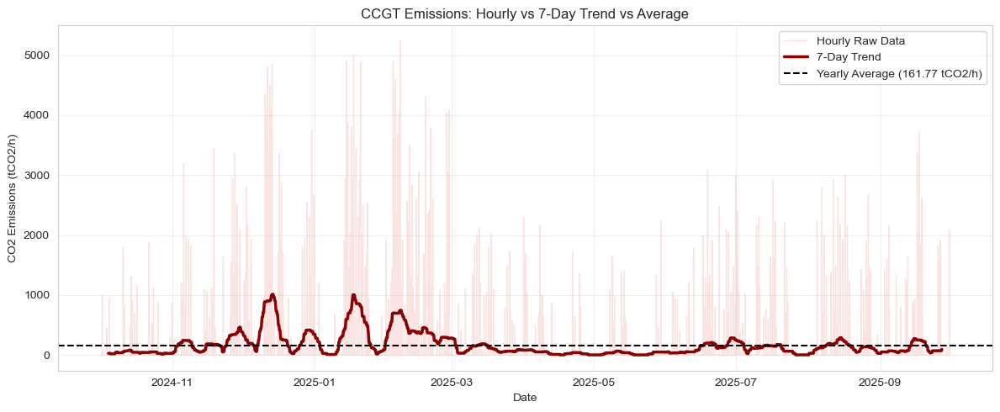

In [48]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CCGT Emissions: Hourly vs 7-Day Trend vs Average")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 1.6. Cost recovery

In [49]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [50]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,549.950238,4481.032035,12482.351062,0.000004,5999.999997
1,NLD,2024-10-01 01:00:00,530.303485,4823.232080,11124.547771,0.000004,5999.999997
2,NLD,2024-10-01 02:00:00,493.366528,5145.118725,9988.931415,0.000004,5999.999997
3,NLD,2024-10-01 03:00:00,459.898204,5507.685166,9260.833298,0.000004,5999.999997
4,NLD,2024-10-01 04:00:00,331.850088,5927.348110,8931.385137,0.000004,5999.999997


In [51]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,549.950238,4481.032035,12482.351062,0.000004,5999.999997
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,530.303485,4823.232080,11124.547771,0.000004,5999.999997
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,493.366528,5145.118725,9988.931415,0.000004,5999.999997
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,459.898204,5507.685166,9260.833298,0.000004,5999.999997
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,331.850088,5927.348110,8931.385137,0.000004,5999.999997


In [52]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        1.152057e+06
wind_onshore    1.616877e+06
hydro           2.568349e+06
ccgt            1.679073e+05
nuclear         1.521232e+06
Name: revenue, dtype: float64

In [53]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        5.631976e+02
wind_onshore    8.459306e+04
hydro           2.214559e+06
ccgt            1.679073e+05
nuclear         3.831336e+05
Name: cost, dtype: float64

In [54]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.152057e+06,5.631976e+02,1.151494e+06,2045.564721
wind_onshore,1.616877e+06,8.459306e+04,1.532284e+06,19.113590
hydro,2.568349e+06,2.214559e+06,3.537894e+05,1.159756
ccgt,1.679073e+05,1.679073e+05,-6.637422e-04,1.000000
nuclear,1.521232e+06,3.831336e+05,1.138098e+06,3.970499


In [55]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.152057e+06,5.631976e+02,1.151494e+06,2045.564721
1,wind_onshore,1.616877e+06,8.459306e+04,1.532284e+06,19.113590
2,hydro,2.568349e+06,2.214559e+06,3.537894e+05,1.159756
3,ccgt,1.679073e+05,1.679073e+05,-6.637422e-04,1.000000
4,nuclear,1.521232e+06,3.831336e+05,1.138098e+06,3.970499


[2025-12-08 22:16:05] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:16:05] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




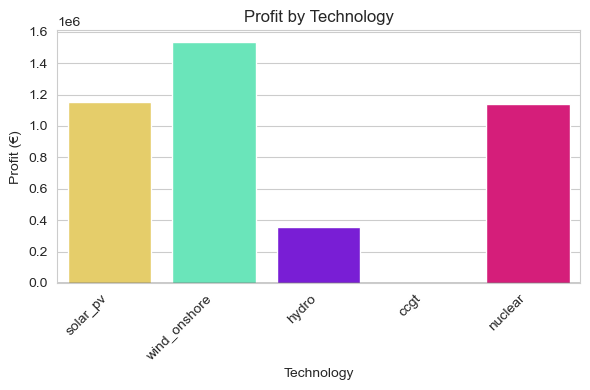

[2025-12-08 22:16:05] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





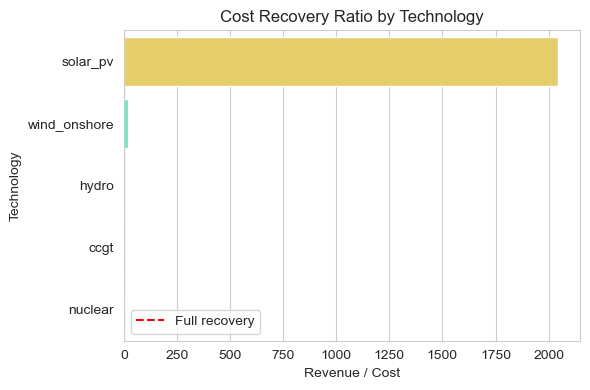

In [56]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 2. Renewables growth case
### 2.1. Reload the model with a scenario that forces a higher capacity of renewables and re-solve

In [59]:
model = calliope.read_yaml('model/model.yaml',scenario='more_renewables')

[2025-12-08 22:16:06] INFO     Loading overrides from scenario: more_renewables 
[2025-12-08 22:16:06] INFO     (scenarios, more_renewables ) | Applying the following overrides: ['higher_solar', 'higher_wind'].
[2025-12-08 22:16:06] INFO     Math init | loading pre-defined math.
[2025-12-08 22:16:06] INFO     Math init | loading math files {'milp', 'base', 'storage_inter_cluster', 'operate', 'spores'}.
[2025-12-08 22:16:06] INFO     Model: preprocessing data
[2025-12-08 22:16:06] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:06] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:06] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:06] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:06] INFO     input data `name` not 

In [60]:
model.build()
model.solve()

[2025-12-08 22:16:06] INFO     Model: backend build starting
[2025-12-08 22:16:07] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-08 22:16:07] INFO     Optimisation Model | variables | Generated.
[2025-12-08 22:16:08] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-08 22:16:12] INFO     Optimisation Model | constraints | Generated.
[2025-12-08 22:16:12] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-08 22:16:12] INFO     Optimisation Model | objectives | Generated.
[2025-12-08 22:16:12] INFO     Model: backend build complete
[2025-12-08 22:16:15] INFO     Optimisation model | starting model in base mode.
[2025-12-08 22:16:19] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpdlppr78c.pyomo.lp
Reading time = 0.35 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [61]:
model.to_netcdf('results/more_vres.nc')

### 2.2. Marginal technology

In [62]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

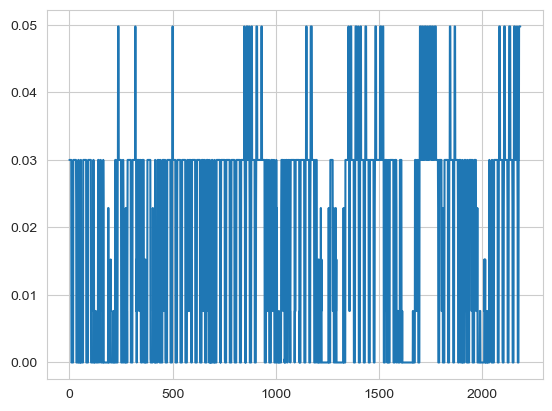

In [63]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [64]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [65]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [66]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  45019 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [67]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  45019 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [68]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,6.747172e-13
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,3.256742e-12
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,6.093303e-12
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,9.088910e-12
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,1.151283e-11


In [69]:
tech_colors = {
    "load_shedding": "#000000",
    "ccgt": "#E37A72",
    "nuclear": "#F3007A",
    "hydro": "#7900f3",
    "solar_pv": "#F9D956",
    "wind_onshore": "#56F9C0",
    "wind_offshore": "#56CBF9"
}

In [70]:
# display timesteps in days_of_interest only
marginal_tech_month = marginal_tech[marginal_tech['timesteps'].isin(days_of_interest)]
marginal_tech_month

,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.030000,0.030000,6.747172e-13
1,2024-10-01 01:00:00,NLD,hydro,0.030000,0.030000,3.256742e-12
2,2024-10-01 02:00:00,NLD,hydro,0.030000,0.030000,6.093303e-12
3,2024-10-01 03:00:00,NLD,hydro,0.030000,0.030000,9.088910e-12
4,2024-10-01 04:00:00,NLD,hydro,0.030000,0.030000,1.151283e-11
...,...,...,...,...,...,...
2180,2024-12-30 20:00:00,NLD,ccgt,0.049768,0.049768,4.262694e-12
2181,2024-12-30 21:00:00,NLD,ccgt,0.049768,0.049768,4.311690e-12
2182,2024-12-30 22:00:00,NLD,ccgt,0.049768,0.049768,7.246238e-12
2183,2024-12-30 23:00:00,NLD,ccgt,0.049768,0.049768,1.687709e-11


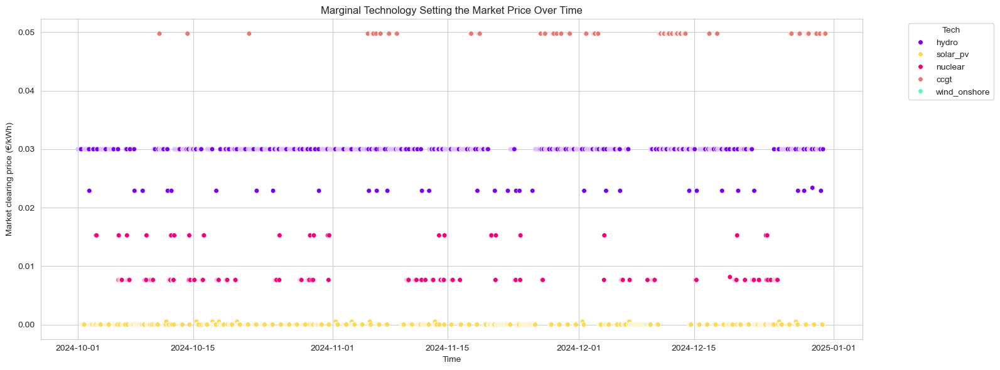

In [71]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal Technology Setting the Market Price Over Time")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro           1044
solar_pv         801
nuclear          200
ccgt             134
wind_onshore       6
Name: count, dtype: int64
techs
hydro           0.477803
solar_pv        0.366590
nuclear         0.091533
ccgt            0.061327
wind_onshore    0.002746
Name: share, dtype: float64
[2025-12-08 22:16:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:16:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




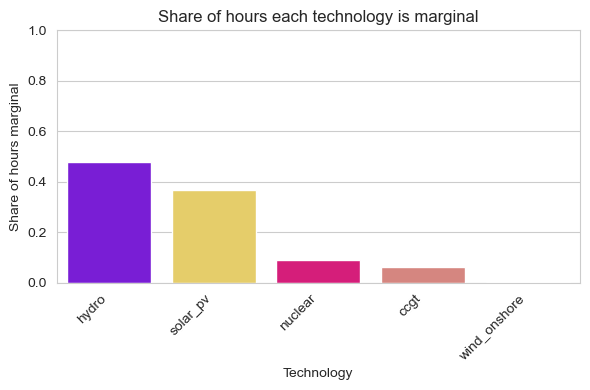

In [72]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Share of hours each technology is marginal')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 2.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [73]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [74]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/more_vres.nc', plot_export_path='results/more_vres.html')

[2025-12-08 22:16:25] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:25] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:25] INFO     Model: initialisation complete


### 2.4.  Load, residual load and price duration curves

In [75]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/more_vres.nc')

[2025-12-08 22:16:26] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:26] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:26] INFO     Model: initialisation complete


In [76]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
ccgt_dispatch.head()

nodes  carriers  timesteps          
NLD    power     2024-10-01 00:00:00    0.000003
                 2024-10-01 01:00:00    0.000003
                 2024-10-01 02:00:00    0.000003
                 2024-10-01 03:00:00    0.000003
                 2024-10-01 04:00:00    0.000003
Name: flow_out, dtype: float64

In [77]:
plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         plot_export_path='results/more_vres_ccgt_ldc.html', 
                         y_label='Flow out (MWh)')

In [78]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/more_vres_price.html', 
                         y_label='Price (EUR/kWh)')

In [79]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       14075.675810
2024-10-01 01:00:00  NLD    power       12434.127627
2024-10-01 02:00:00  NLD    power       11047.411280
2024-10-01 03:00:00  NLD    power       10029.513122
2024-10-01 04:00:00  NLD    power        9441.089547
dtype: float64

In [80]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/more_vres_residual_load.html',
                         y_label='Residual Load (MWh)')


### 2.5. CO2 emissions

In [81]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [82]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [83]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [84]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 446,719.17 tCO2

Total CO2 emissions: 446,719.17 tCO2
Total CO2 emissions: 0.447 MtCO2


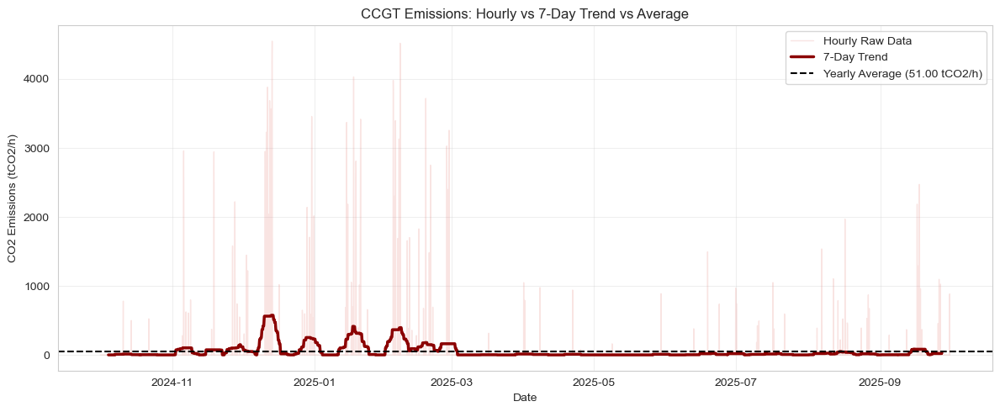

In [85]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CCGT Emissions: Hourly vs 7-Day Trend vs Average")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 2.6. Cost recovery

In [86]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [87]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,1020.789306,8416.868218,8075.675811,0.000003,5999.999997
1,NLD,2024-10-01 01:00:00,984.322013,9059.633693,6434.127628,0.000003,5999.999997
2,NLD,2024-10-01 02:00:00,915.761537,9664.243849,5047.411282,0.000003,5999.999997
3,NLD,2024-10-01 03:00:00,853.639357,10345.264188,4029.513123,0.000003,5999.999997
4,NLD,2024-10-01 04:00:00,615.963041,11133.530745,3441.089549,0.000003,5999.999997


In [88]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,1020.789306,8416.868218,8075.675811,0.000003,5999.999997
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,984.322013,9059.633693,6434.127628,0.000003,5999.999997
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,915.761537,9664.243849,5047.411282,0.000003,5999.999997
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,853.639357,10345.264188,4029.513123,0.000003,5999.999997
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,615.963041,11133.530745,3441.089549,0.000003,5999.999997


In [89]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        2.902467e+05
wind_onshore    1.478347e+06
hydro           1.179549e+06
ccgt            5.293454e+04
nuclear         8.160977e+05
Name: revenue, dtype: float64

In [90]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        1.045208e+03
wind_onshore    1.588939e+05
hydro           1.066120e+06
ccgt            5.293454e+04
nuclear         2.380556e+05
Name: cost, dtype: float64

In [91]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,2.902467e+05,1.045208e+03,2.892015e+05,277.692786
wind_onshore,1.478347e+06,1.588939e+05,1.319453e+06,9.303987
hydro,1.179549e+06,1.066120e+06,1.134287e+05,1.106394
ccgt,5.293454e+04,5.293454e+04,-4.708649e-04,1.000000
nuclear,8.160977e+05,2.380556e+05,5.780421e+05,3.428181


In [92]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,2.902467e+05,1.045208e+03,2.892015e+05,277.692786
1,wind_onshore,1.478347e+06,1.588939e+05,1.319453e+06,9.303987
2,hydro,1.179549e+06,1.066120e+06,1.134287e+05,1.106394
3,ccgt,5.293454e+04,5.293454e+04,-4.708649e-04,1.000000
4,nuclear,8.160977e+05,2.380556e+05,5.780421e+05,3.428181


[2025-12-08 22:16:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:16:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




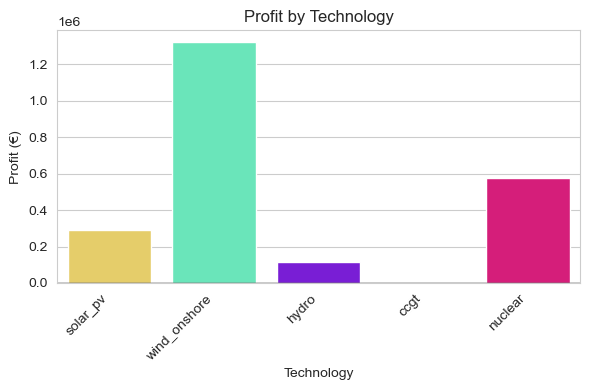

[2025-12-08 22:16:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





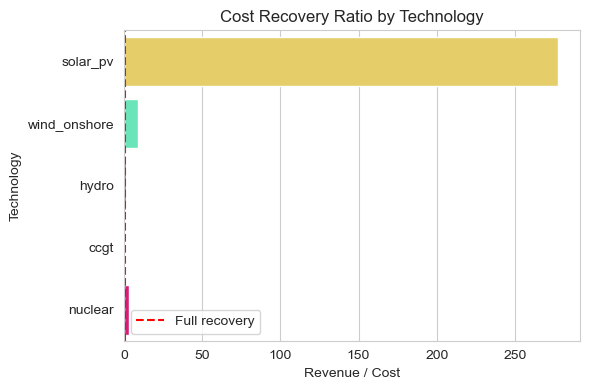

In [93]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 3. Nuclear phase out
### 3.1 Reload the model with a scenario that forces a lower capacity of nuclear

In [94]:
model = calliope.read_yaml('model/model.yaml',scenario='less_nuclear')

[2025-12-08 22:16:27] INFO     Loading overrides from scenario: less_nuclear 
[2025-12-08 22:16:27] INFO     (scenarios, less_nuclear ) | Applying the following overrides: ['lower_nuclear'].
[2025-12-08 22:16:27] INFO     Math init | loading pre-defined math.
[2025-12-08 22:16:27] INFO     Math init | loading math files {'milp', 'base', 'storage_inter_cluster', 'operate', 'spores'}.
[2025-12-08 22:16:27] INFO     Model: preprocessing data
[2025-12-08 22:16:27] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:28] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:28] INFO     input data `name` not defined in model mat

In [95]:
model.build()
model.solve()

[2025-12-08 22:16:28] INFO     Model: backend build starting
[2025-12-08 22:16:28] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-08 22:16:29] INFO     Optimisation Model | variables | Generated.
[2025-12-08 22:16:30] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-08 22:16:34] INFO     Optimisation Model | constraints | Generated.
[2025-12-08 22:16:34] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-08 22:16:34] INFO     Optimisation Model | objectives | Generated.
[2025-12-08 22:16:34] INFO     Model: backend build complete
[2025-12-08 22:16:38] INFO     Optimisation model | starting model in base mode.
[2025-12-08 22:16:44] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmp0kx7yzey.pyomo.lp
Reading time = 0.69 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [96]:
model.to_netcdf('results/less_nuclear.nc')

### 3.2. Marginal technology

In [97]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

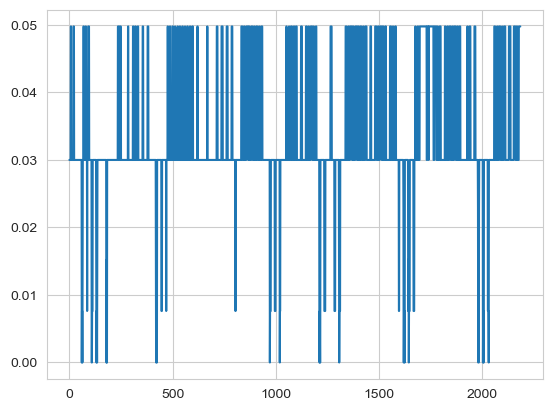

In [98]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [99]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [100]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [101]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [102]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [103]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,3.864199e-10
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,2.159670e-10
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,1.381813e-10
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,1.015442e-10
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,8.701779e-11


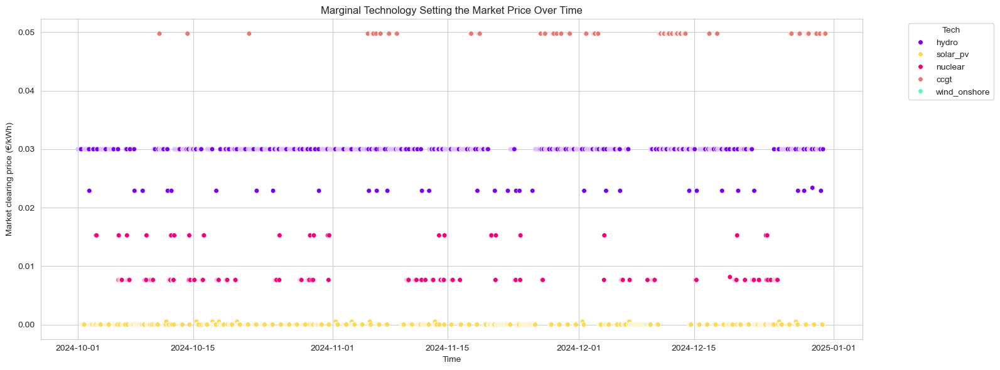

In [104]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal Technology Setting the Market Price Over Time")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro           1044
solar_pv         801
nuclear          200
ccgt             134
wind_onshore       6
Name: count, dtype: int64
techs
hydro           0.477803
solar_pv        0.366590
nuclear         0.091533
ccgt            0.061327
wind_onshore    0.002746
Name: share, dtype: float64
[2025-12-08 22:16:50] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:16:50] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




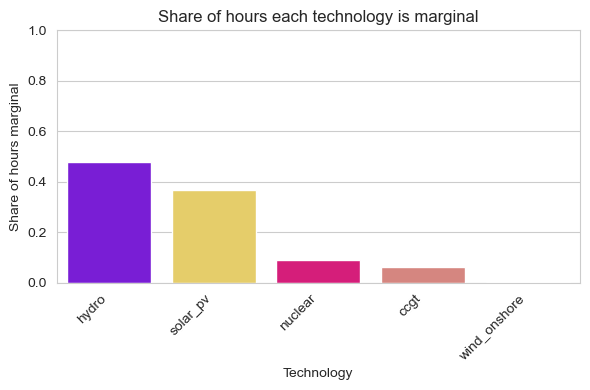

In [105]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Share of hours each technology is marginal')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 3.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [106]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [107]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/less_nuclear.nc', plot_export_path='results/less_nuclear_dispatch.html')

[2025-12-08 22:16:51] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:51] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:51] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:51] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:51] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:51] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:51] INFO     Model: initialisation complete


### 3.4.  Load, residual load and price duration curves

In [108]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/less_nuclear.nc')

[2025-12-08 22:16:51] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:16:51] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:51] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:51] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:52] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:52] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:52] INFO     Model: initialisation complete


In [109]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
ccgt_dispatch.head()

nodes  carriers  timesteps          
NLD    power     2024-10-01 00:00:00    0.000095
                 2024-10-01 01:00:00    0.000095
                 2024-10-01 02:00:00    0.000095
                 2024-10-01 03:00:00    0.000095
                 2024-10-01 04:00:00    0.000095
Name: flow_out, dtype: float64

In [110]:
plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         plot_export_path='results/less_nuclear_ccgt_ldc.html', 
                         y_label='Flow out (MWh)')

In [111]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/less_nuclear_price.html', 
                         y_label='Price (EUR/kWh)')

In [112]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       18482.351060
2024-10-01 01:00:00  NLD    power       17124.547769
2024-10-01 02:00:00  NLD    power       15988.931413
2024-10-01 03:00:00  NLD    power       15260.833297
2024-10-01 04:00:00  NLD    power       14931.385135
dtype: float64

In [113]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/less_nuclear_residual_load.html',
                         y_label='Residual Load (MWh)')


### 3.5. CO2 emissions

In [114]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [115]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [116]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [117]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 2,533,763.26 tCO2

Total CO2 emissions: 2,533,763.26 tCO2
Total CO2 emissions: 2.534 MtCO2


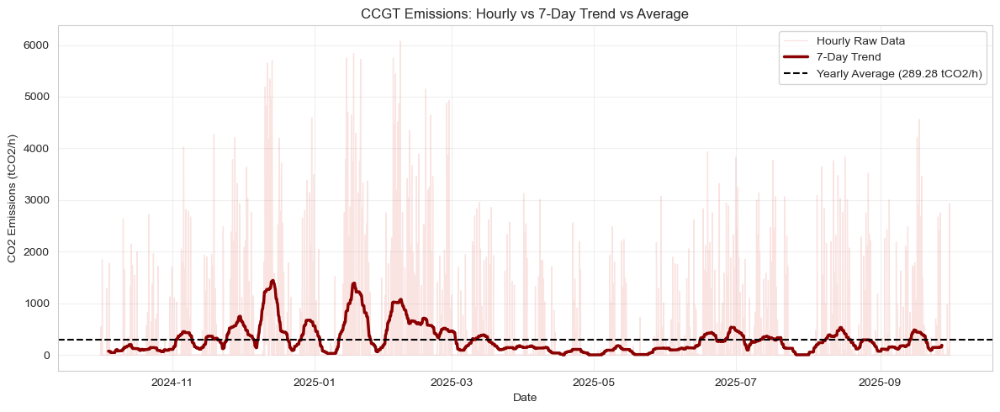

In [118]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CCGT Emissions: Hourly vs 7-Day Trend vs Average")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 3.6. Cost recovery

In [119]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [120]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,549.950238,4481.032035,14482.351103,0.000095,3999.999916
1,NLD,2024-10-01 01:00:00,530.303485,4823.232080,13124.547812,0.000095,3999.999916
2,NLD,2024-10-01 02:00:00,493.366528,5145.118725,11988.931456,0.000095,3999.999916
3,NLD,2024-10-01 03:00:00,459.898204,5507.685166,11260.833340,0.000095,3999.999916
4,NLD,2024-10-01 04:00:00,331.850088,5927.348110,10931.385178,0.000095,3999.999916


In [121]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,549.950238,4481.032035,14482.351103,0.000095,3999.999916
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,530.303485,4823.232080,13124.547812,0.000095,3999.999916
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,493.366528,5145.118725,11988.931456,0.000095,3999.999916
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,459.898204,5507.685166,11260.833340,0.000095,3999.999916
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,331.850088,5927.348110,10931.385178,0.000095,3999.999916


In [122]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        1.399268e+06
wind_onshore    1.761161e+06
hydro           3.165375e+06
ccgt            3.002414e+05
nuclear         1.126245e+06
Name: revenue, dtype: float64

In [123]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        5.632124e+02
wind_onshore    8.459306e+04
hydro           2.608702e+06
ccgt            3.002414e+05
nuclear         2.620275e+05
Name: cost, dtype: float64

In [124]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.399268e+06,5.632124e+02,1.398705e+06,2484.440614
wind_onshore,1.761161e+06,8.459306e+04,1.676568e+06,20.819214
hydro,3.165375e+06,2.608702e+06,5.566735e+05,1.213391
ccgt,3.002414e+05,3.002414e+05,-1.561488e-02,1.000000
nuclear,1.126245e+06,2.620275e+05,8.642177e+05,4.298194


In [125]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.399268e+06,5.632124e+02,1.398705e+06,2484.440614
1,wind_onshore,1.761161e+06,8.459306e+04,1.676568e+06,20.819214
2,hydro,3.165375e+06,2.608702e+06,5.566735e+05,1.213391
3,ccgt,3.002414e+05,3.002414e+05,-1.561488e-02,1.000000
4,nuclear,1.126245e+06,2.620275e+05,8.642177e+05,4.298194


[2025-12-08 22:16:52] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:16:53] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




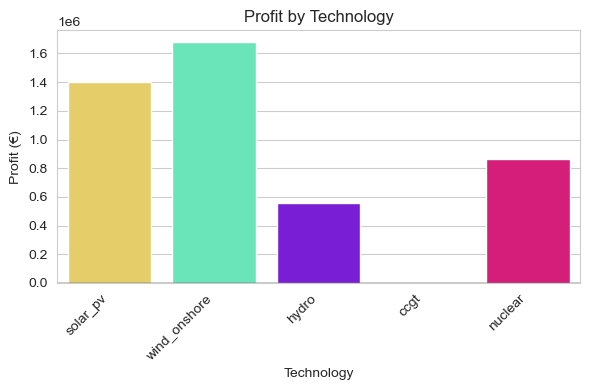

[2025-12-08 22:16:53] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





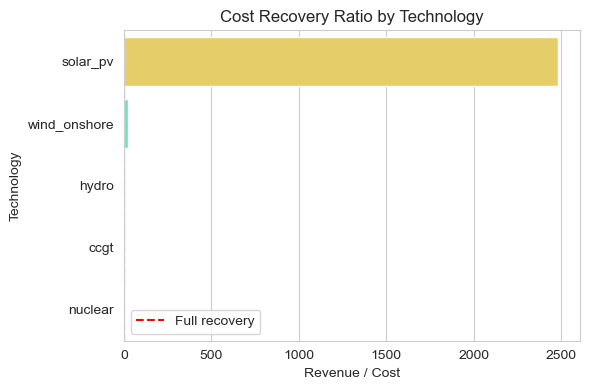

In [126]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 4. Combine increasing renewables and nuclear phase out
### 4.1 Reload the model with a scenario that forces a higher renewables and lower capacity of nuclear

In [127]:
model = calliope.read_yaml('model/model.yaml',scenario='combination')

[2025-12-08 22:16:53] INFO     Loading overrides from scenario: combination 
[2025-12-08 22:16:53] INFO     (scenarios, combination ) | Applying the following overrides: ['higher_solar', 'lower_nuclear', 'higher_wind'].
[2025-12-08 22:16:53] INFO     Math init | loading pre-defined math.
[2025-12-08 22:16:53] INFO     Math init | loading math files {'milp', 'base', 'storage_inter_cluster', 'operate', 'spores'}.
[2025-12-08 22:16:53] INFO     Model: preprocessing data
[2025-12-08 22:16:53] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:16:53] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:53] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:53] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:16:54] INFO     input data `n

In [128]:
model.build()
model.solve()

[2025-12-08 22:16:54] INFO     Model: backend build starting
[2025-12-08 22:16:54] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-08 22:16:55] INFO     Optimisation Model | variables | Generated.
[2025-12-08 22:16:56] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-08 22:17:01] INFO     Optimisation Model | constraints | Generated.
[2025-12-08 22:17:01] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-08 22:17:01] INFO     Optimisation Model | objectives | Generated.
[2025-12-08 22:17:01] INFO     Model: backend build complete
[2025-12-08 22:17:04] INFO     Optimisation model | starting model in base mode.
[2025-12-08 22:17:08] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpf9g13mex.pyomo.lp
Reading time = 0.41 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [129]:
model.to_netcdf('results/combination.nc')

### 4.2. Marginal technology

In [130]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

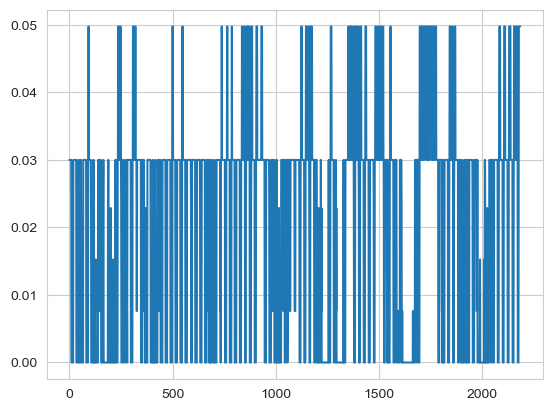

In [131]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [132]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [133]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [134]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  45019 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [135]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  45019 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [136]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,1.409307e-11
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,7.579180e-13
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,1.353584e-11
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,2.441223e-11
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,3.181121e-11


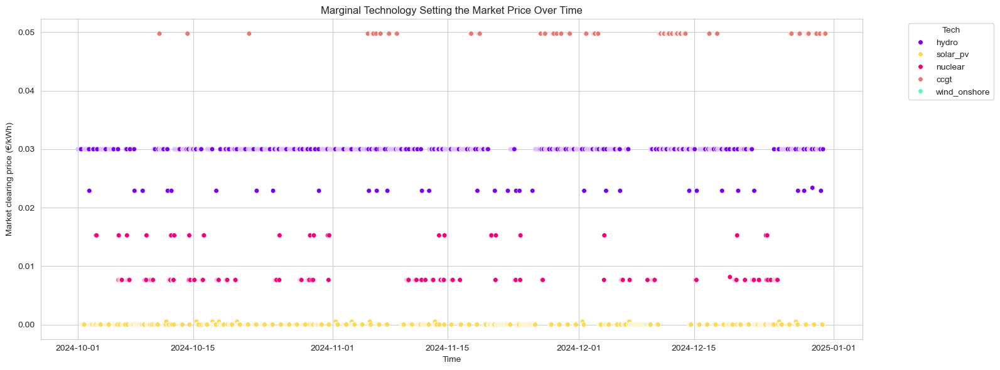

In [137]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal Technology Setting the Market Price Over Time")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro           1044
solar_pv         801
nuclear          200
ccgt             134
wind_onshore       6
Name: count, dtype: int64
techs
hydro           0.477803
solar_pv        0.366590
nuclear         0.091533
ccgt            0.061327
wind_onshore    0.002746
Name: share, dtype: float64
[2025-12-08 22:17:15] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:17:15] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\1571455509.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




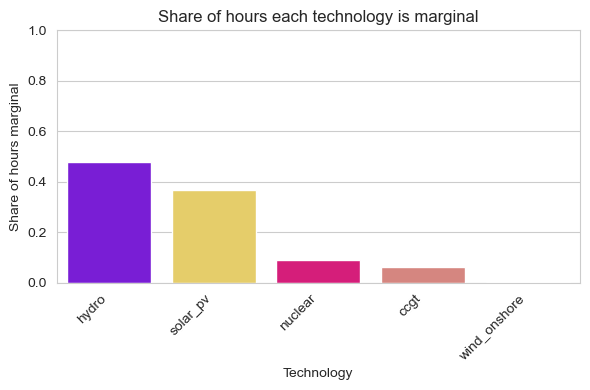

In [138]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Share of hours each technology is marginal')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 4.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [139]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [140]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/combination.nc', plot_export_path='results/combination.html')

[2025-12-08 22:17:15] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:17:15] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:17:16] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:16] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:16] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:16] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:16] INFO     Model: initialisation complete


### 4.4.  Load, residual load and price duration curves

In [141]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/combination.nc')

[2025-12-08 22:17:16] INFO     Model: preprocessing data (reentry)
[2025-12-08 22:17:16] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-08 22:17:16] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:16] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:17] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:17] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-08 22:17:17] INFO     Model: initialisation complete


In [142]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
ccgt_dispatch.head()

nodes  carriers  timesteps          
NLD    power     2024-10-01 00:00:00    0.000020
                 2024-10-01 01:00:00    0.000021
                 2024-10-01 02:00:00    0.000021
                 2024-10-01 03:00:00    0.000021
                 2024-10-01 04:00:00    0.000021
Name: flow_out, dtype: float64

In [143]:
plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         plot_export_path='results/combination_ccgt_ldc.html', 
                         y_label='Flow out (MWh)')

In [144]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/combination_price.html', 
                         y_label='Price (EUR/kWh)')

In [145]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       14075.675810
2024-10-01 01:00:00  NLD    power       12434.127627
2024-10-01 02:00:00  NLD    power       11047.411280
2024-10-01 03:00:00  NLD    power       10029.513122
2024-10-01 04:00:00  NLD    power        9441.089547
dtype: float64

In [146]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/combination_residual_load.html',
                         y_label='Residual Load (MWh)')


### 4.5. CO2 emissions

In [147]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [148]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [149]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [150]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 821,152.89 tCO2

Total CO2 emissions: 821,152.89 tCO2
Total CO2 emissions: 0.821 MtCO2


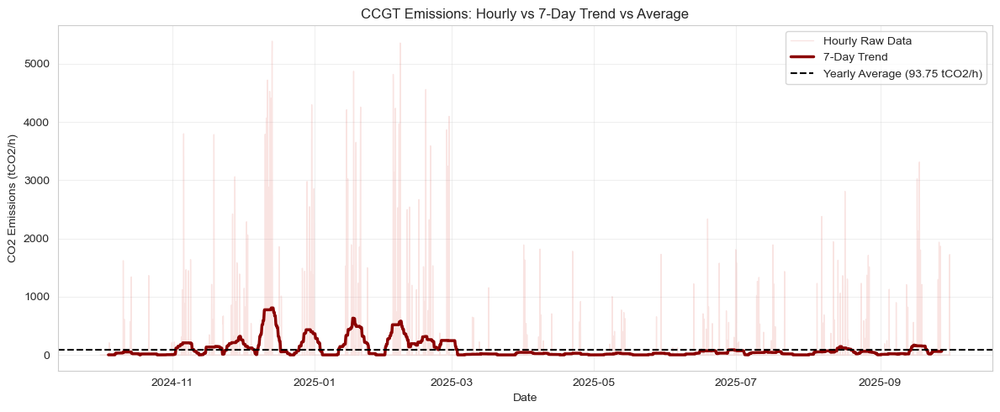

In [151]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CCGT Emissions: Hourly vs 7-Day Trend vs Average")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 4.6. Cost recovery

In [152]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [153]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,1020.789306,8416.868218,10075.675815,0.000020,3999.999985
1,NLD,2024-10-01 01:00:00,984.322013,9059.633693,8434.127632,0.000021,3999.999985
2,NLD,2024-10-01 02:00:00,915.761537,9664.243849,7047.411285,0.000021,3999.999985
3,NLD,2024-10-01 03:00:00,853.639357,10345.264188,6029.513127,0.000021,3999.999985
4,NLD,2024-10-01 04:00:00,615.963041,11133.530745,5441.089552,0.000021,3999.999985


In [154]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,1020.789306,8416.868218,10075.675815,0.000020,3999.999985
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,984.322013,9059.633693,8434.127632,0.000021,3999.999985
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,915.761537,9664.243849,7047.411285,0.000021,3999.999985
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,853.639357,10345.264188,6029.513127,0.000021,3999.999985
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,615.963041,11133.530745,5441.089552,0.000021,3999.999985


In [155]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        3.461939e+05
wind_onshore    1.660543e+06
hydro           1.491043e+06
ccgt            9.730353e+04
nuclear         6.059760e+05
Name: revenue, dtype: float64

In [156]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        1.045208e+03
wind_onshore    1.588939e+05
hydro           1.297944e+06
ccgt            9.730353e+04
nuclear         1.674190e+05
Name: cost, dtype: float64

In [157]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,3.461939e+05,1.045208e+03,3.451487e+05,331.220089
wind_onshore,1.660543e+06,1.588939e+05,1.501649e+06,10.450643
hydro,1.491043e+06,1.297944e+06,1.930988e+05,1.148773
ccgt,9.730353e+04,9.730353e+04,-2.984055e-03,1.000000
nuclear,6.059760e+05,1.674190e+05,4.385570e+05,3.619518


In [158]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,3.461939e+05,1.045208e+03,3.451487e+05,331.220089
1,wind_onshore,1.660543e+06,1.588939e+05,1.501649e+06,10.450643
2,hydro,1.491043e+06,1.297944e+06,1.930988e+05,1.148773
3,ccgt,9.730353e+04,9.730353e+04,-2.984055e-03,1.000000
4,nuclear,6.059760e+05,1.674190e+05,4.385570e+05,3.619518


[2025-12-08 22:17:18] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-08 22:17:18] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




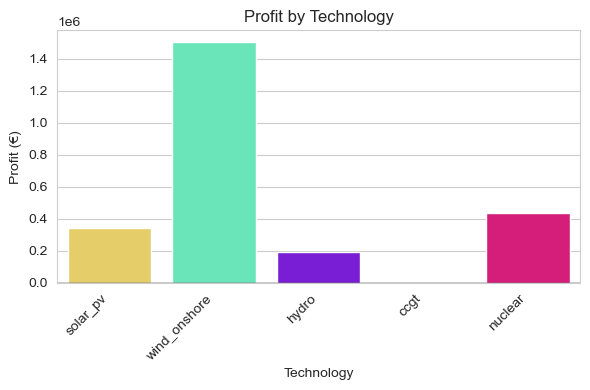

[2025-12-08 22:17:18] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_25320\560198715.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





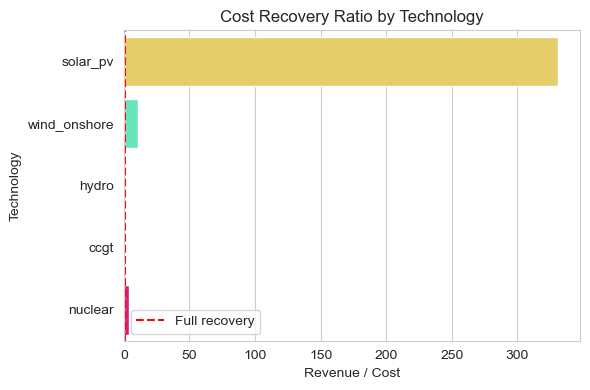

In [159]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()